## Self-Driving Car Engineer Nanodegree

**Advanced Lane Finding Project**

The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

### Set dependency

In [1]:
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os, sys 
sys.path.append('lib/')
from vtcv.dataset import visualize_dataset as vd
from functools import partial
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import pickle
import imageio
imageio.plugins.ffmpeg.download()

##### Functions from previous step

In [2]:
def undistort_img(img, camparam, dpRslt=False):
    '''
    h,  w = img.shape[:2]
    newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))
    undist = cv2.undistort(img, mtx, dist, None, newcameramtx)
    # crop the image
    x,y,w,h = roi
    undist = undist[y:y+h, x:x+w]
    '''
    undist = cv2.undistort(img, camparam['mtx'], camparam['dist'], None, camparam['mtx'])
    
    if dpRslt :
        fig, axs = plt.subplots(1,2, figsize=(16, 11))
        fig.subplots_adjust(hspace = .1, wspace=.001)
        axs = axs.ravel()
        axs_set = [a.axis('off') for a in axs]    
        axs[0].imshow(img)
        axs[1].imshow(undist)
        
    return undist

### 3. Thresholded binary image.
* Use color transforms, gradients, etc., to create a thresholded binary image.

In [3]:
with open('camparam.p', 'rb') as handle:
    camparam = pickle.load(handle)

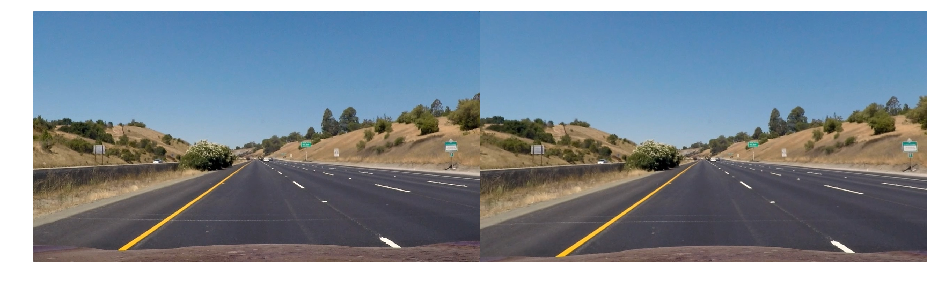

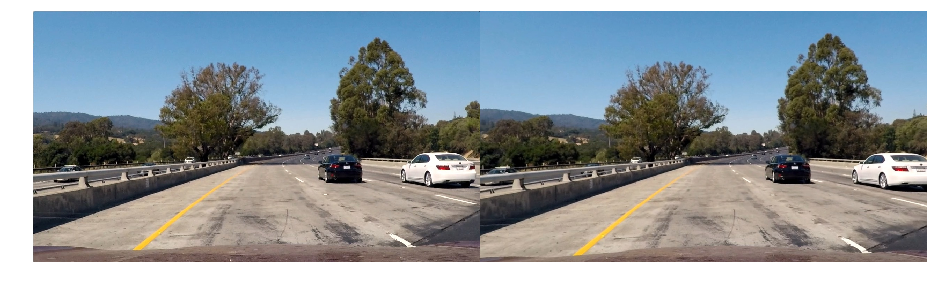

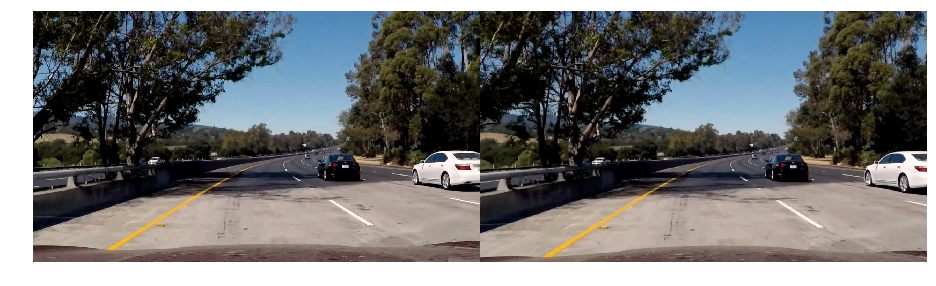

In [4]:
imgs1 = cv2.imread('test_images/straight_lines1.jpg')
imgs1 = cv2.cvtColor(imgs1,cv2.COLOR_BGR2RGB)
imgs1 = undistort_img(imgs1, camparam, dpRslt=True )
img1 = cv2.imread('test_images/test1.jpg')
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img1 = undistort_img(img1, camparam, dpRslt=True )
img5 = cv2.imread('test_images/test5.jpg')
img5 = cv2.cvtColor(img5,cv2.COLOR_BGR2RGB)
img5 = undistort_img(img5, camparam, dpRslt=True )

### HLS channel selection

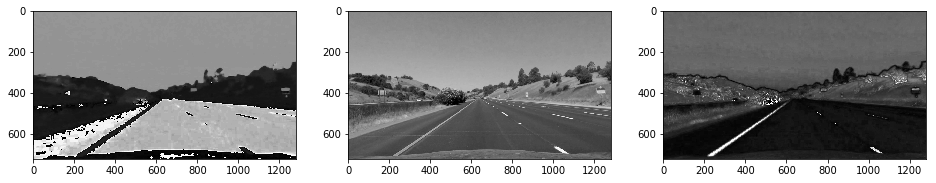

In [5]:
hls = cv2.cvtColor(imgs1, cv2.COLOR_RGB2HLS)
fig, axs = plt.subplots(1,3, figsize=(16, 11))
axs[0].imshow(hls[:,:,0],cmap='gray')
axs[1].imshow(hls[:,:,1],cmap='gray')
axs[2].imshow(hls[:,:,2],cmap='gray')

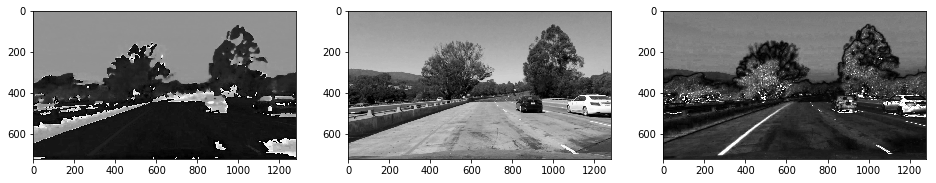

In [6]:
hls = cv2.cvtColor(img1, cv2.COLOR_RGB2HLS)
fig, axs = plt.subplots(1,3, figsize=(16, 11))
axs[0].imshow(hls[:,:,0],cmap='gray')
axs[1].imshow(hls[:,:,1],cmap='gray')
axs[2].imshow(hls[:,:,2],cmap='gray')

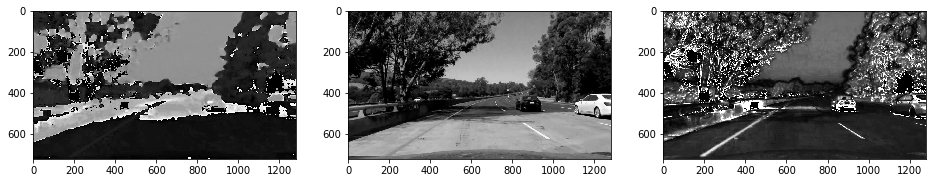

In [7]:
hls = cv2.cvtColor(img5, cv2.COLOR_RGB2HLS)
fig, axs = plt.subplots(1,3, figsize=(16, 11))
axs[0].imshow(hls[:,:,0],cmap='gray')
axs[1].imshow(hls[:,:,1],cmap='gray')
axs[2].imshow(hls[:,:,2],cmap='gray')

In [8]:
def hls_denoised_lanefilter(img, dpRslt=False) :
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    #h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    if dpRslt :
        fig, axs = plt.subplots(1,4, figsize=(16, 11))
        fig.subplots_adjust(hspace = .1, wspace=.01)
        axs = axs.ravel()
        axs_set = [a.axis('off') for a in axs]  
    
    if dpRslt :
        axs[0].set_title("l_channel")
        axs[0].imshow(l_channel,cmap='gray')
    
    #filter_out = cv2.bilateralFilter(filter_out,50,50,50)
    #filter_out = cv2.fastNlMeansDenoisingColored(filter_out,None,10,10,7,21)    
    s_channel=cv2.medianBlur(s_channel,11)
    
    if dpRslt :
        axs[1].set_title("s_channel  ")
        axs[1].imshow(s_channel,cmap='gray')

    l_s_merge = cv2.addWeighted(l_channel,0.5,s_channel,0.5,0)
    l_s_merge = cv2.dilate(l_s_merge, (10,10), iterations=5)
    if dpRslt :
        axs[2].set_title("l_channel + s_channel ")
        axs[2].imshow(l_s_merge,cmap='gray')
    
    #filter_out = cv2.bilateralFilter(filter_out,50,50,50)
    median_blur_l_s_merge=cv2.medianBlur(l_s_merge,11)
    #filter_out = cv2.fastNlMeansDenoisingColored(filter_out,None,10,10,7,21)

    if dpRslt :
        axs[3].set_title("apply median blur")
        axs[3].imshow(median_blur_l_s_merge,cmap='gray')
    
    merged_out = cv2.addWeighted(l_s_merge,0.7,median_blur_l_s_merge,0.6,0)
    
    if dpRslt :
        fig, axs = plt.subplots(1,2, figsize=(16, 11))
        fig.subplots_adjust(hspace = .1, wspace=.003)
        axs = axs.ravel()
        axs_set = [a.axis('off') for a in axs]
        axs[0].imshow(img)
        axs[1].imshow(merged_out,cmap='gray')
        
    # Return the binary image
    return merged_out 


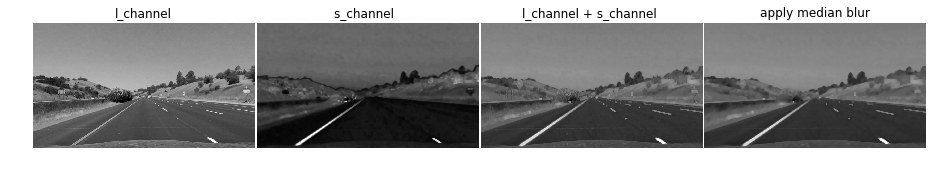

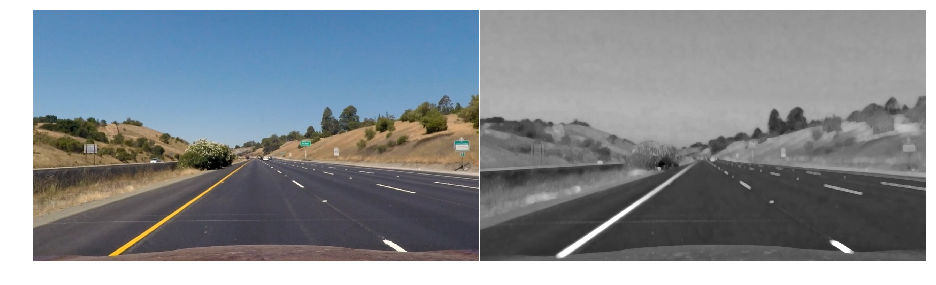

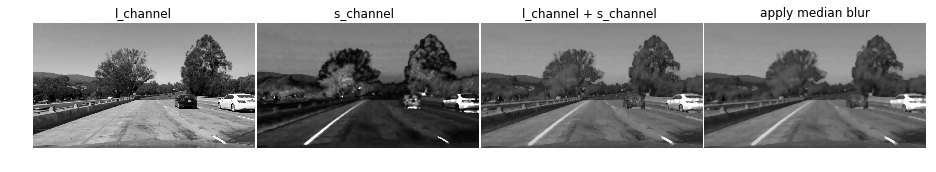

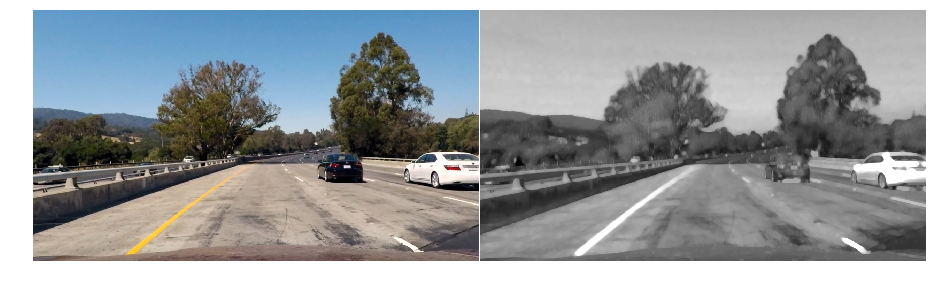

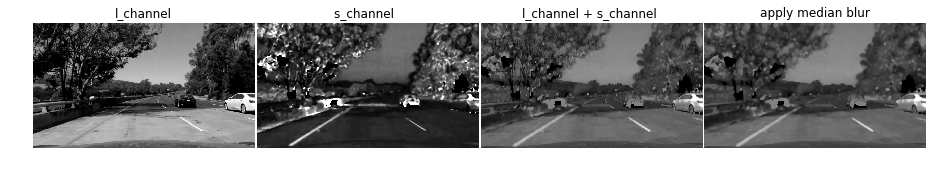

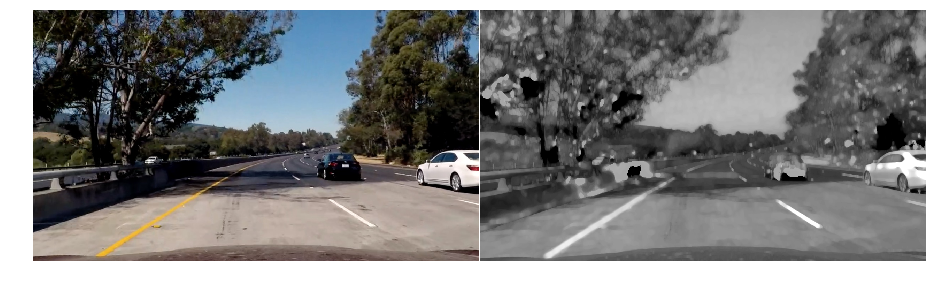

In [9]:
lane_hls = hls_denoised_lanefilter(imgs1,dpRslt=True)
lane_hls = hls_denoised_lanefilter(img1,dpRslt=True)
lane_hls = hls_denoised_lanefilter(img5,dpRslt=True)

### Check overal impression on HLS lane emphasize

In [10]:
def lane_hls_pipeline(img,camparam,dpRslt=False) :
    img = undistort_img(img, camparam, dpRslt=False )
    #bin_img = frame_binaryzation(img,dspRslt=False,thresh=(120,255),dspDebug=False)
    bin_img = hls_denoised_lanefilter(img,dpRslt=False) 
    col_binary = cv2.cvtColor(bin_img,cv2.COLOR_GRAY2RGB)
    #bin_img = bin_img.astype(int)
    #col_binary = cv2.merge([bin_img,bin_img,bin_img])
    
    if dpRslt :
        fig, axs = plt.subplots(1,2, figsize=(16, 11))
        fig.subplots_adjust(hspace = .1, wspace=.001)
        axs = axs.ravel()
        axs_set = [a.axis('off') for a in axs]    
        axs[0].imshow(img)
        axs[1].imshow(col_binary,cmap='gray')
    
    return col_binary

In [11]:
## Load camera calibration parameters
with open('camparam.p', 'rb') as handle:
    camparam_loaded = pickle.load(handle)
    
## Input Video
project_video = 'project_video.mp4'
cahllenge_video = 'challenge_video.mp4'
harder_cahllenge_video = 'harder_challenge_video.mp4'

## Ouput
hls_denoised_thsh_project_video = 'temp/hls_denoised_thsh_project_video.mp4'
hls_denoised_lane_challenge_video = 'temp/hls_denoised_lane_challenge_video.mp4'
hls_denoised_lane_harder_challenge_video = 'temp/hls_denoised_lane_harder_challenge_video.mp4'

## Process project_video
#lane_pipeline(img,camparam,dpRslt=False) :
clip = VideoFileClip(project_video)#.subclip(0,1)
proc_clip = clip.fl_image(partial(lane_hls_pipeline ,camparam=camparam_loaded,dpRslt=False))
%time proc_clip.write_videofile(hls_denoised_thsh_project_video, audio=False)

clip = VideoFileClip(cahllenge_video)#.subclip(0,1)
proc_clip = clip.fl_image(partial(lane_hls_pipeline ,camparam=camparam_loaded,dpRslt=False))
%time proc_clip.write_videofile(hls_denoised_lane_challenge_video, audio=False)

clip = VideoFileClip(harder_cahllenge_video)#.subclip(0,1)
proc_clip = clip.fl_image(partial(lane_hls_pipeline ,camparam=camparam_loaded,dpRslt=False))
%time proc_clip.write_videofile(hls_denoised_lane_harder_challenge_video, audio=False)

[MoviePy] >>>> Building video temp/hls_denoised_thsh_project_video.mp4
[MoviePy] Writing video temp/hls_denoised_thsh_project_video.mp4


100%|█████████▉| 1260/1261 [04:17<00:00,  4.89it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: temp/hls_denoised_thsh_project_video.mp4 

CPU times: user 13min 28s, sys: 17min 57s, total: 31min 25s
Wall time: 4min 18s
[MoviePy] >>>> Building video temp/hls_denoised_lane_challenge_video.mp4
[MoviePy] Writing video temp/hls_denoised_lane_challenge_video.mp4


100%|██████████| 485/485 [01:38<00:00,  4.95it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: temp/hls_denoised_lane_challenge_video.mp4 

CPU times: user 5min 9s, sys: 6min 52s, total: 12min 1s
Wall time: 1min 38s
[MoviePy] >>>> Building video temp/hls_denoised_lane_harder_challenge_video.mp4
[MoviePy] Writing video temp/hls_denoised_lane_harder_challenge_video.mp4


100%|█████████▉| 1199/1200 [04:01<00:00,  4.96it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: temp/hls_denoised_lane_harder_challenge_video.mp4 

CPU times: user 12min 20s, sys: 16min 16s, total: 28min 37s
Wall time: 4min 2s


In [12]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video><br/>
<video width="960" height="540" controls>
  <source src="{1}">
</video><br/>
<video width="960" height="540" controls>
  <source src="{2}">
</video>
""".format(hls_denoised_thsh_project_video,hls_denoised_lane_challenge_video,hls_denoised_lane_harder_challenge_video))

### Thresolding

In [13]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255), dilate=0, dpRslt=False):
    # Convert to grayscale
    if len(img.shape) > 2 :
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else :
        gray = img
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
        
    #abs_sobel = cv2.GaussianBlur(abs_sobel,(7,7),0) # thresh = (0.5,1.2) , (0.3,1.3)        
    abs_sobel[(abs_sobel < thresh[0]) | (abs_sobel > thresh[1])] = 0
    
    if dilate > 0 :
        abs_sobel = cv2.dilate(abs_sobel, (10,10), iterations=dilate)
        
    if dpRslt :
        fig, axs = plt.subplots(1,2, figsize=(16, 11))
        fig.subplots_adjust(hspace = .1, wspace=.003)
        axs = axs.ravel()
        axs_set = [a.axis('off') for a in axs]
        if len(img.shape) > 2 :
            axs[0].imshow(img)
        else :
            axs[0].imshow(img,cmap='gray')
        axs[1].imshow(abs_sobel,cmap='gray')
        
    return abs_sobel

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255), dilate=0, dpRslt=False):
    # Convert to grayscale
    if len(img.shape) > 2 :
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else :
        gray = img
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 

    #gradmag = cv2.GaussianBlur(gradmag,(7,7),0) # thresh = (0.5,1.2) , (0.3,1.3)
    gradmag[(gradmag < mag_thresh[0]) | (gradmag > mag_thresh[1])] = 0
        
    # Create a binary image of ones where threshold is met, zeros otherwise
    if dilate > 0 :    
        gradmag = cv2.dilate(gradmag, (10,10), iterations=dilate)
        
    if dpRslt :
        fig, axs = plt.subplots(1,2, figsize=(16, 11))
        fig.subplots_adjust(hspace = .1, wspace=.003)
        axs = axs.ravel()
        axs_set = [a.axis('off') for a in axs]    
        if len(img.shape) > 2 :
            axs[0].imshow(img)
        else :
            axs[0].imshow(img,cmap='gray')
        axs[1].imshow(gradmag,cmap='gray')
        
    return gradmag

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2), dilate=0, dpRslt=False):
    # Grayscale
    if len(img.shape) > 2 :
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else :
        gray = img
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
        
    #print ("absgraddir max : ", np.max(absgraddir))
    #print ("absgraddir min : ", np.min(absgraddir))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 255 
    #absgraddir[(absgraddir < thresh[0]) | (absgraddir > thresh[1])] = 0
    if dilate > 0 :    
        binary_output = cv2.dilate(binary_output, (10,10), iterations=dilate)
        
    if dpRslt :
        fig, axs = plt.subplots(1,2, figsize=(16, 11))
        fig.subplots_adjust(hspace = .1, wspace=.003)
        axs = axs.ravel()
        axs_set = [a.axis('off') for a in axs]    
        if len(img.shape) > 2 :
            axs[0].imshow(img)
        else :
            axs[0].imshow(img,cmap='gray')
        axs[1].imshow(binary_output,cmap='gray')
        
    # Return the binary image
    return binary_output

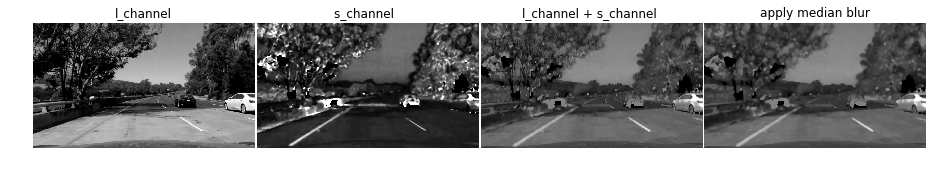

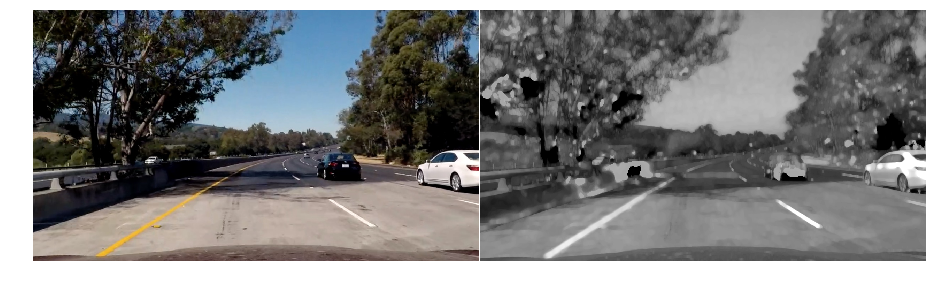

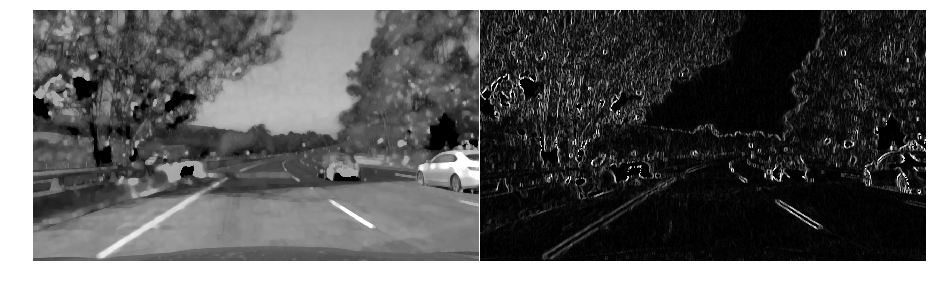

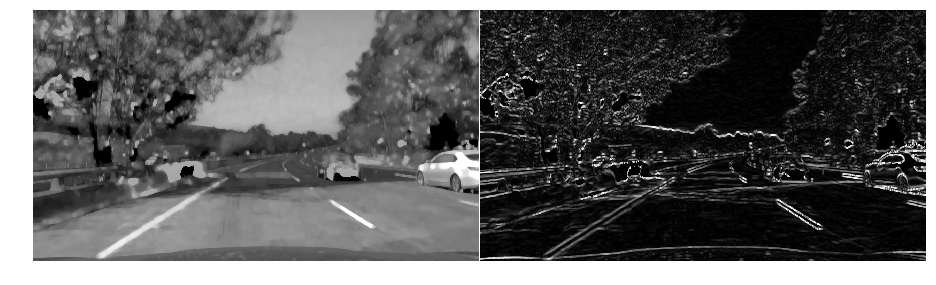

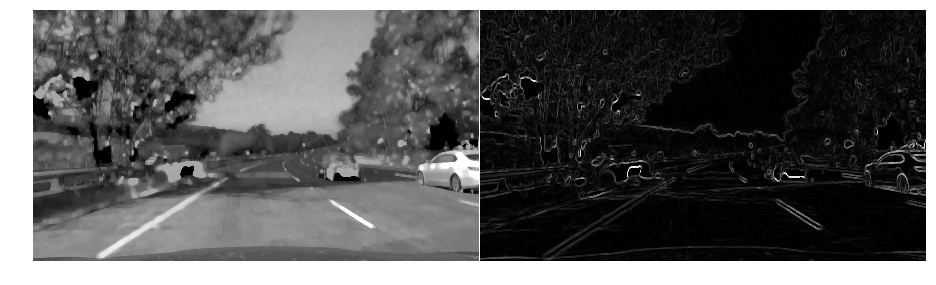

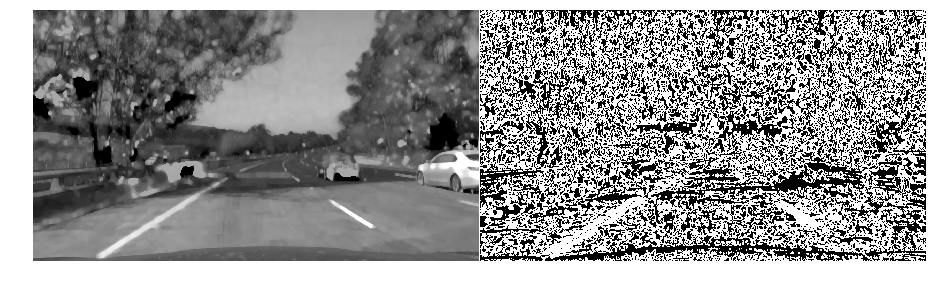

In [14]:
lane_hls = hls_denoised_lanefilter(img5,dpRslt=True)
rslt1 = abs_sobel_thresh(lane_hls, orient='x', thresh=(0,255), dilate=3, dpRslt=True )
rslt2 = abs_sobel_thresh(lane_hls, orient='y', thresh=(0,255), dilate=3, dpRslt=True )
rslt3 = mag_thresh(lane_hls, mag_thresh=(0, 255), dilate=3, dpRslt=True )
rslt4 = dir_threshold(lane_hls, sobel_kernel=15, thresh=(0.5, 1.2), dilate=2, dpRslt=True)

### Combined_Binary 

In [173]:
# Apply each of the thresholding functions
def frame_binaryzation(img,dspRslt=False, thresh=(200,255), dspDebug=False) :
    if dspDebug :
        fig, axs = plt.subplots(2,5, figsize=(16, 5))
        fig.subplots_adjust(hspace = .001, wspace=.01)
        axs = axs.ravel()
        axs_set = [a.axis('off') for a in axs]  
    
    ## denoised hls 
    bilateral_hls = hls_denoised_lanefilter(img,dpRslt=False) 
    if dspDebug :
        axs[0].set_title("Bilateral HLS ")
        axs[0].imshow(bilateral_hls,cmap='gray')
    
    # sobel x on denoised HLS
    sobx = abs_sobel_thresh(bilateral_hls, orient='x', thresh=(0,255), dilate=3, dpRslt=False )
    if dspDebug :
        axs[1].set_title("abs_sobel_thresh x")
        axs[1].imshow(sobx,cmap='gray')

    soby = abs_sobel_thresh(bilateral_hls, orient='y', thresh=(0,255), dilate=3, dpRslt=False )
    if dspDebug :
        axs[2].set_title("abs_sobel_thresh y")
        axs[2].imshow(soby,cmap='gray')

    magth = mag_thresh(bilateral_hls, mag_thresh=(0, 255), dilate=2, dpRslt=False )
    if dspDebug :
        axs[3].set_title("mag_thresh")
        axs[3].imshow(magth,cmap='gray')

    #gblr = cv2.GaussianBlur(bilateral_hls,(21,21),0) # thresh = (0.5,1.2) , (0.3,1.3)
    dirth = dir_threshold(bilateral_hls, sobel_kernel=15, thresh=(0.3, 1.3), dilate=2, dpRslt=False)
    if dspDebug :
        axs[4].set_title("dir_threshold")
        axs[4].imshow(magth,cmap='gray')
    
    bilateral_hls= bilateral_hls.astype(np.float64)
    magth = magth.astype(np.float64)
    sobel_result = cv2.addWeighted(sobx, 0.5, soby, 0.5, 0)
    if dspDebug :
        axs[5].set_title("sobel_result")
        axs[5].imshow(sobel_result,cmap='gray')

    sob_grad_result = cv2.addWeighted(sobel_result, 0.3, magth, 0.7, 0)
    if dspDebug :
        axs[6].set_title("sob_grad_result")
        axs[6].imshow(sob_grad_result,cmap='gray')
    
    hls_drith_mask = cv2.addWeighted(bilateral_hls, 0.9, dirth, 0.3, 0)
    if dspDebug :
        axs[7].set_title("hls_dirth_mask")
        axs[7].imshow(hls_drith_mask,cmap='gray')

    lane_recog_mask= cv2.addWeighted(sob_grad_result, 0.7, hls_drith_mask, 0.3, 0)
    if dspDebug :
        axs[8].set_title("lane_recog_mask")
        axs[8].imshow(lane_recog_mask,cmap='gray')
    
    final_lane_mask= cv2.addWeighted(bilateral_hls, 0.3, lane_recog_mask, 0.7, 0)
    if dspDebug :
        axs[9].set_title("final_lane_mask")
        axs[9].imshow(final_lane_mask,cmap='gray')

    final_lane_mask = cv2.erode(final_lane_mask, (5,5), iterations=2)
    #final_lane_mask = cv2.GaussianBlur(final_lane_mask,(5,5),0)   
    binary_output =  np.zeros_like(final_lane_mask)
    binary_output[(final_lane_mask >= thresh[0]) & (final_lane_mask <= thresh[1])] = 255 

    #lx = abs_sobel_thresh(binary_output, orient='x', thresh=(0,255), dilate=2, dpRslt=False )
    #ly = abs_sobel_thresh(binary_output, orient='y', thresh=(0,255), dilate=2, dpRslt=False )
    #binary_output[(lx > 100) & (ly>100) & (binary_output>200) ] = 255

    #colored_binary = cv2.merge([binary_output,binary_output,binary_output])
    #output = colored_binary
    #output = cv2.Canny(colored_binary,50,150)

    output = binary_output

    if dspRslt :
        fig, axs = plt.subplots(1,2, figsize=(16, 11))
        fig.subplots_adjust(hspace = .1, wspace=.003)
        axs = axs.ravel()
        axs_set = [a.axis('off') for a in axs]    
        if len(img.shape) > 2 :
            axs[0].imshow(img)
        else :
            axs[0].imshow(img,cmap='gray')
        #axs[1].imshow(output)#,cmap='gray')
        axs[1].imshow(output,cmap='gray')
        
    return output

CPU times: user 6.64 s, sys: 613 ms, total: 7.25 s
Wall time: 810 ms


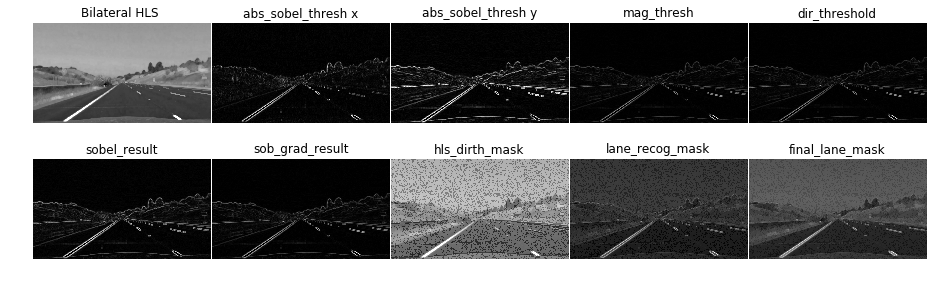

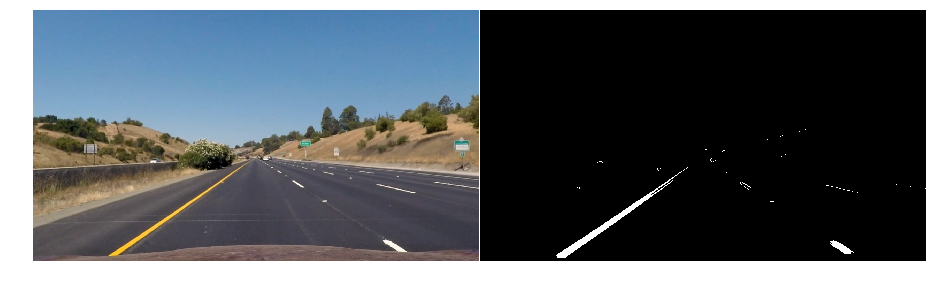

In [174]:
%%time
bin_img = frame_binaryzation(imgs1,dspRslt=True,thresh=(120,255),dspDebug=True)
#bin_img = frame_binaryzation(imgs1,dspRslt=True,dspDebug=True)

### Test with test images

# sample : 8  sampling_rate : 1.0  # of data : 8
size =  (256, 256, 3)


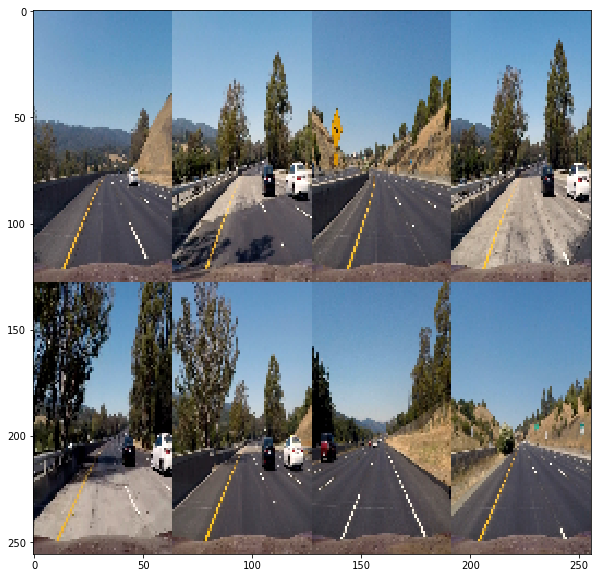

In [175]:
# Check camera calibration images
test_imgs = vd.show_sampled_dataset_from_dir('test_images',filepat='*.jpg',sampling_rate=1.0)

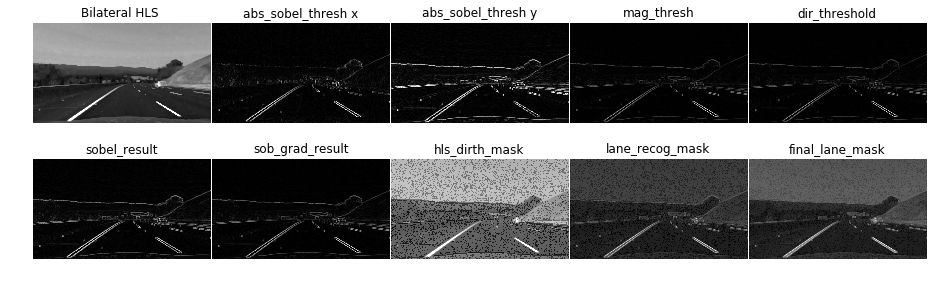

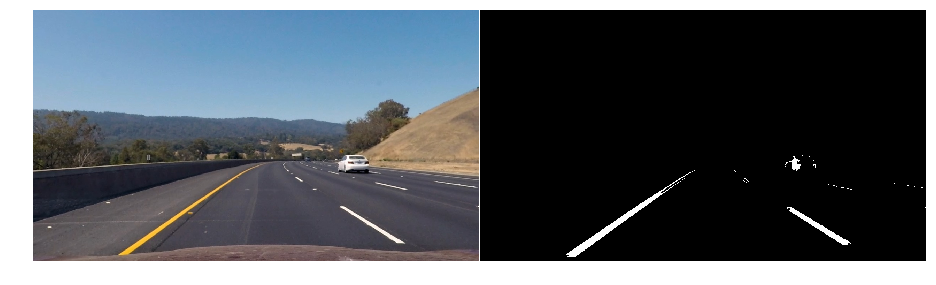

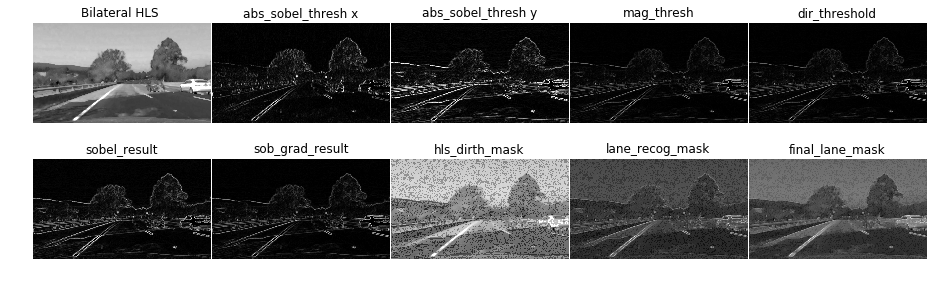

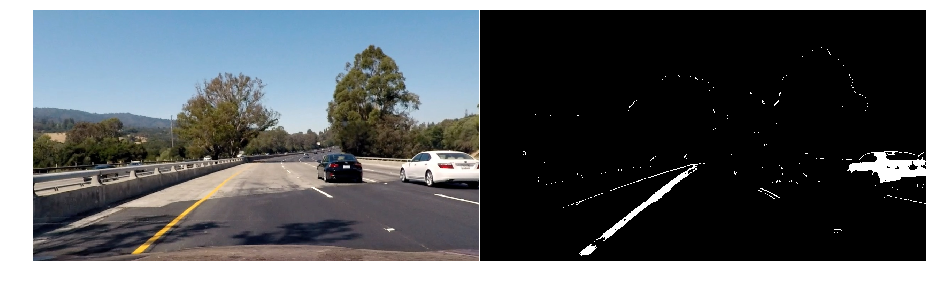

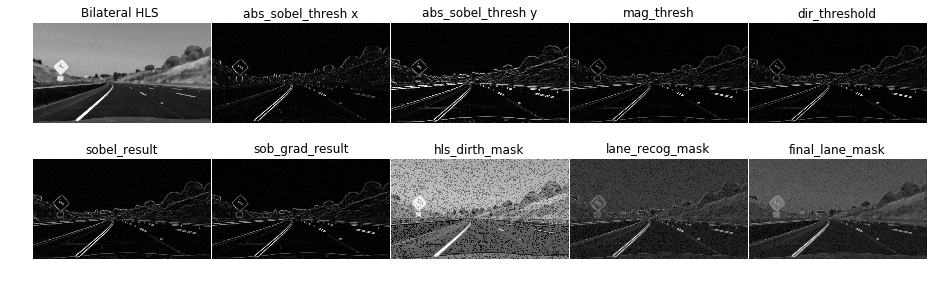

...

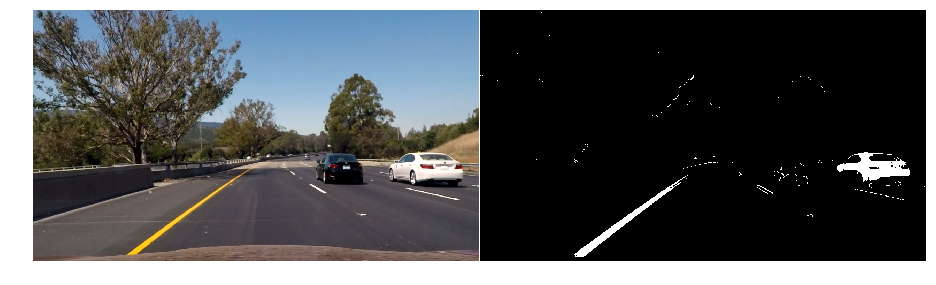

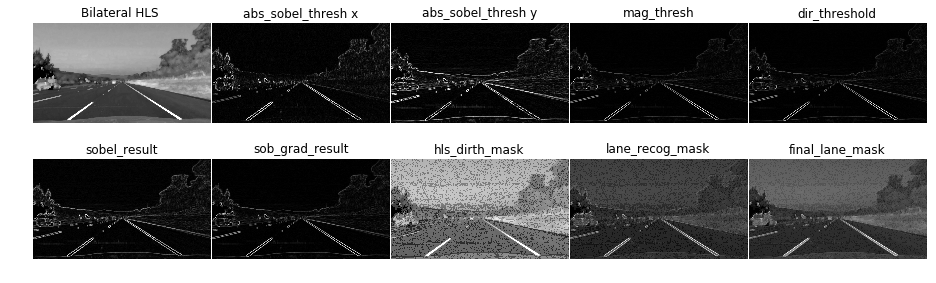

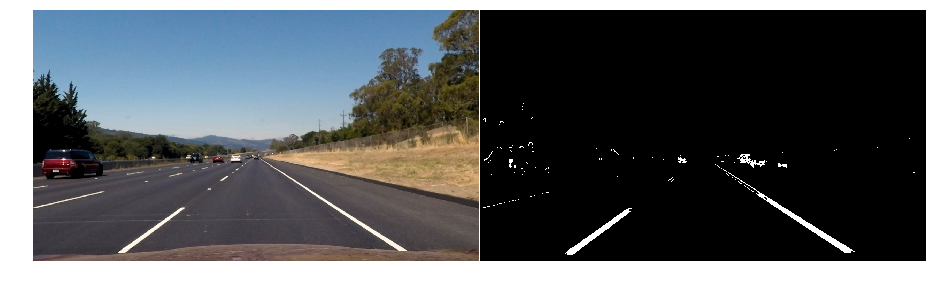

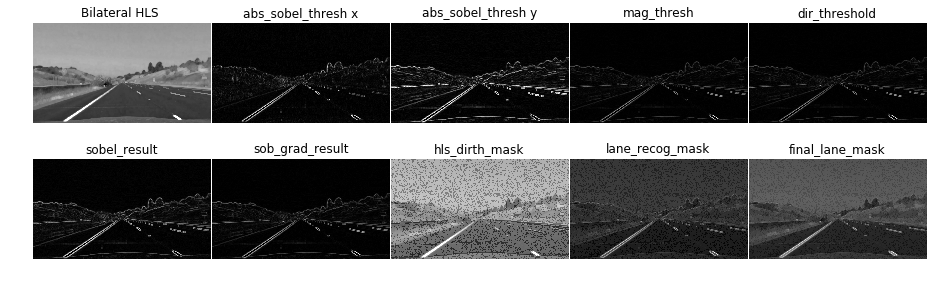

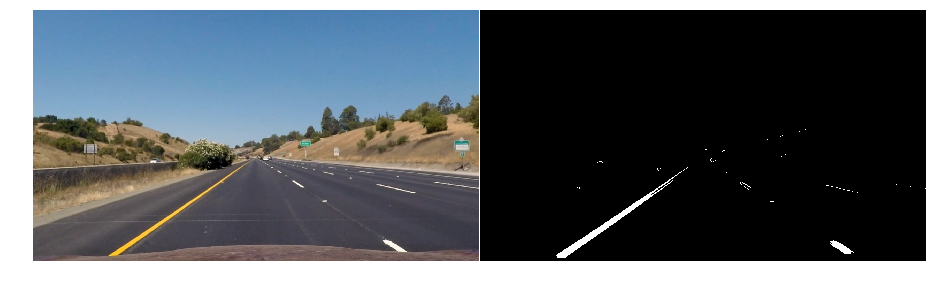

In [176]:
for img_path in test_imgs :
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img = undistort_img(img, camparam, dpRslt=False )
    bin_img = frame_binaryzation(img,dspRslt=True,thresh=(120,255),dspDebug=True)

### Apply the pipeline to video

In [177]:
def lane_pipeline(img,camparam,dpRslt=False) :
    img = undistort_img(img, camparam, dpRslt=False )
    bin_img = frame_binaryzation(img,dspRslt=False,thresh=(120,255),dspDebug=False)
    bin_img = bin_img.astype(int)
    col_binary = cv2.merge([bin_img,bin_img,bin_img])
    
    if dpRslt :
        fig, axs = plt.subplots(1,2, figsize=(16, 11))
        fig.subplots_adjust(hspace = .1, wspace=.001)
        axs = axs.ravel()
        axs_set = [a.axis('off') for a in axs]    
        axs[0].imshow(img)
        axs[1].imshow(col_binary,cmap='gray')
    
    return col_binary

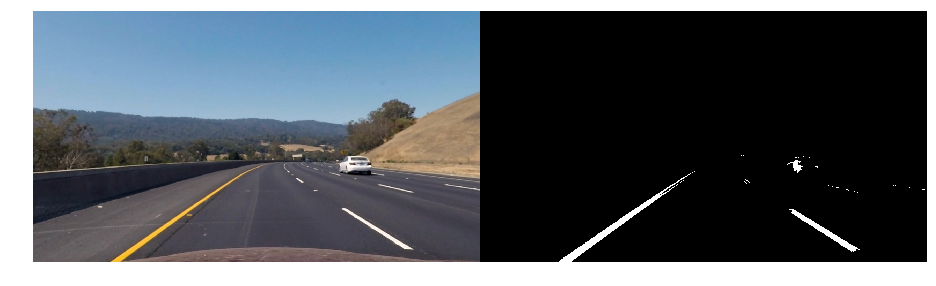

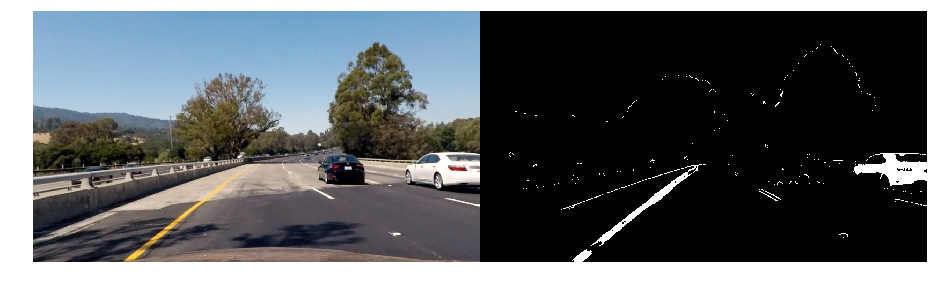

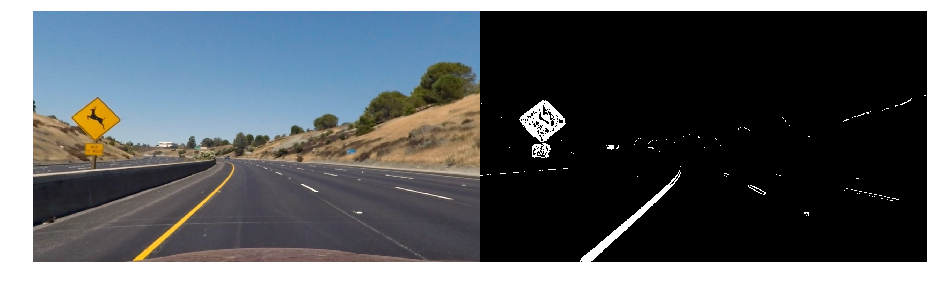

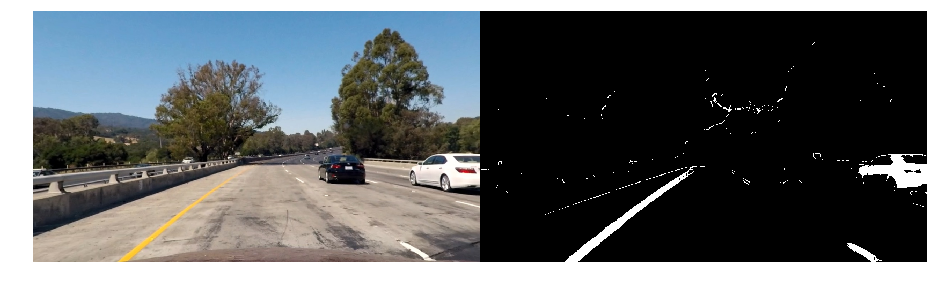

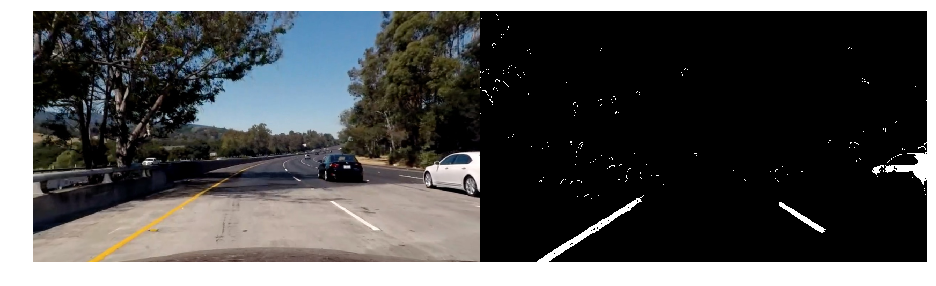

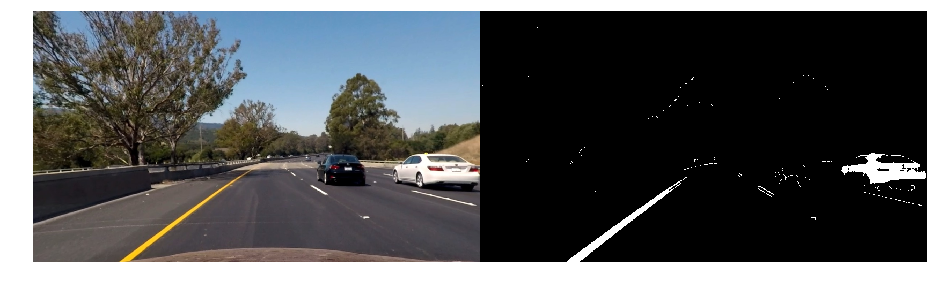

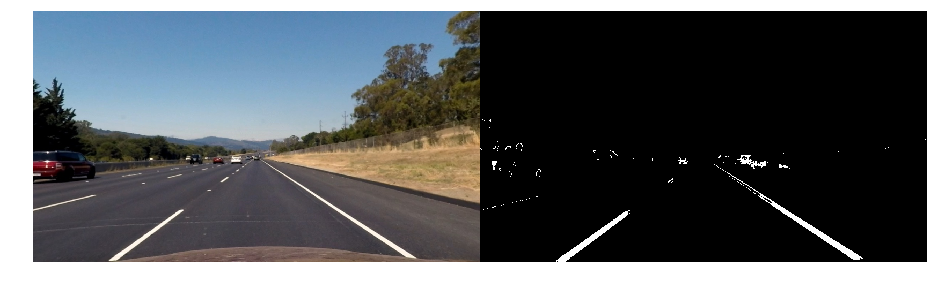

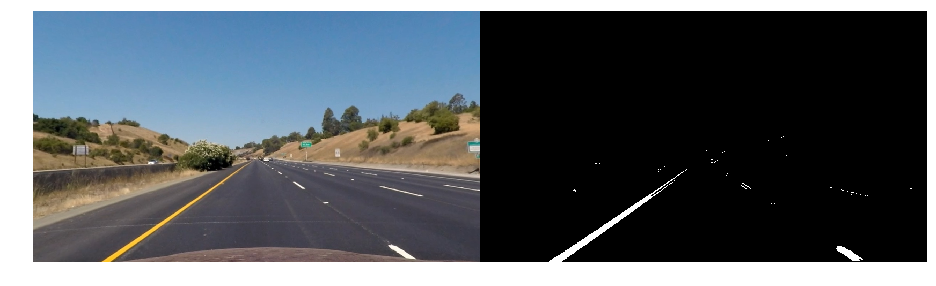

In [178]:
for img_path in test_imgs :
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img = undistort_img(img, camparam, dpRslt=False)
    bin_img = lane_pipeline(img,camparam,dpRslt=True)

### Now to video clip

In [179]:
## Input Video
project_video = 'project_video.mp4'
cahllenge_video = 'challenge_video.mp4'
harder_cahllenge_video = 'harder_challenge_video.mp4'

## Ouput
binary_thsh_project_video = 'temp/binary_thsh_project_video.mp4'
binary_thsh_cahllenge_video = 'temp/binary_thsh_challenge_video.mp4'
binary_thsh_harder_cahllenge_video = 'temp/binary_thsh_harder_challenge_video.mp4'

In [180]:
## Load camera calibration parameters
with open('camparam.p', 'rb') as handle:
    camparam_loaded = pickle.load(handle)

#### thresolding with bilateral filter : processing performance 

(0,0.2) => on my mac 10.7 s 

(0,0.2) => on mint-r920 7.63 s 

project_video whole = 44 min ( on my mbp )

project_video whole = 31 min ( on my mint r920 )


#### thresolding with median filter : processing performance 

project_video whole = 9 min ( on mint r920 )

In [181]:
## Process project_video
#lane_pipeline(img,camparam,dpRslt=False) :
clip = VideoFileClip(project_video)#.subclip(0,0.2)
proc_clip = clip.fl_image(partial(lane_pipeline, camparam=camparam_loaded ,dpRslt=False))
%time proc_clip.write_videofile(binary_thsh_project_video, audio=False)

[MoviePy] >>>> Building video temp/binary_thsh_project_video.mp4
[MoviePy] Writing video temp/binary_thsh_project_video.mp4


100%|█████████▉| 1260/1261 [09:20<00:00,  2.25it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: temp/binary_thsh_project_video.mp4 

CPU times: user 1h 55min 52s, sys: 21min 6s, total: 2h 16min 58s
Wall time: 9min 20s


In [182]:
## Process cahllenge_video
clip = VideoFileClip(cahllenge_video)
proc_clip = clip.fl_image(partial(lane_pipeline, camparam=camparam_loaded ,dpRslt=False))
%time proc_clip.write_videofile(binary_thsh_cahllenge_video, audio=False)

[MoviePy] >>>> Building video temp/binary_thsh_challenge_video.mp4
[MoviePy] Writing video temp/binary_thsh_challenge_video.mp4


100%|██████████| 485/485 [03:44<00:00,  2.16it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: temp/binary_thsh_challenge_video.mp4 

CPU times: user 45min 19s, sys: 8min 38s, total: 53min 57s
Wall time: 3min 45s


In [183]:
## Process harder_cahllenge_video
clip = VideoFileClip(harder_cahllenge_video)
proc_clip = clip.fl_image(partial(lane_pipeline, camparam=camparam_loaded ,dpRslt=False))
%time proc_clip.write_videofile(binary_thsh_harder_cahllenge_video, audio=False)

[MoviePy] >>>> Building video temp/binary_thsh_harder_challenge_video.mp4
[MoviePy] Writing video temp/binary_thsh_harder_challenge_video.mp4


100%|█████████▉| 1199/1200 [09:16<00:00,  2.15it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: temp/binary_thsh_harder_challenge_video.mp4 

CPU times: user 1h 51min 7s, sys: 21min 45s, total: 2h 12min 52s
Wall time: 9min 17s


In [184]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video><br/>
<video width="960" height="540" controls>
  <source src="{1}">
</video><br/>
<video width="960" height="540" controls>
  <source src="{2}">
</video>
""".format(binary_thsh_project_video,binary_thsh_cahllenge_video,binary_thsh_harder_cahllenge_video))